In [2]:
import sys, os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization,AveragePooling2D
from keras.losses import categorical_crossentropy
#from keras.optimizers import Adam

from tensorflow.keras.optimizers import Adam
from keras.regularizers import l2
from keras.utils import np_utils
# pd.set_option('display.max_rows', 500)
# pd.set_option('display.max_columns', 500)
# pd.set_option('display.width', 1000)

In [3]:
from sklearn.model_selection import train_test_split
df=pd.read_csv('fer2013.csv')

In [4]:
print(df.head())

   emotion                                             pixels     Usage
0        0  70 80 82 72 58 58 60 63 54 58 60 48 89 115 121...  Training
1        0  151 150 147 155 148 133 111 140 170 174 182 15...  Training
2        2  231 212 156 164 174 138 161 173 182 200 106 38...  Training
3        4  24 32 36 30 32 23 19 20 30 41 21 22 32 34 21 1...  Training
4        6  4 0 0 0 0 0 0 0 0 0 0 0 3 15 23 28 48 50 58 84...  Training


In [6]:
df.tail()

,emotion,pixels,Usage
35882,6,50 36 17 22 23 29 33 39 34 37 37 37 39 43 48 5...,PrivateTest
35883,3,178 174 172 173 181 188 191 194 196 199 200 20...,PrivateTest
35884,0,17 17 16 23 28 22 19 17 25 26 20 24 31 19 27 9...,PrivateTest
35885,3,30 28 28 29 31 30 42 68 79 81 77 67 67 71 63 6...,PrivateTest
35886,2,19 13 14 12 13 16 21 33 50 57 71 84 97 108 122...,PrivateTest


In [3]:
em=df['emotion']

In [4]:
x_axis = np.array(['angry', 'disgust', 'fear', 'happy', 'sad', 'surprise', 'neutral'])[em.unique()]

<BarContainer object of 7 artists>

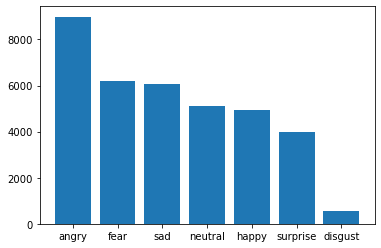

In [5]:
plt.bar(x_axis, em.value_counts())

In [6]:
X_train,train_y,X_test,test_y=[],[],[],[]
x_val,y_val=[],[]

In [9]:
df['Usage'].unique()

array(['Training', 'PublicTest', 'PrivateTest'], dtype=object)

In [10]:
for index, row in df.iterrows():
    val=row['pixels'].split(" ")
    try:
        if 'Training' in row['Usage']:
           X_train.append(np.array(val,'float32'))
           train_y.append(row['emotion'])
        elif 'PublicTest' in row['Usage']:
           X_test.append(np.array(val,'float32'))
           test_y.append(row['emotion'])
        elif 'PrivateTest'in row['Usage']:
           X_test.append(np.array(val,'float32'))
           test_y.append(row['emotion'])
    except:
        print(f"error occured at index :{index} and row:{row}")

In [11]:
num_features = 64
num_labels = 7
batch_size = 64
epochs = 20
#Size of each image 48*48 pixels
width, height = 48, 48

In [12]:
X_train = np.array(X_train,'float32')
train_y = np.array(train_y,'float32')
X_test = np.array(X_test,'float32')
test_y = np.array(test_y,'float32')

train_y=np_utils.to_categorical(train_y, num_classes=num_labels)
test_y=np_utils.to_categorical(test_y, num_classes=num_labels)

#### normalizing data between 0 and 1

In [13]:
#cannot produce
#normalizing data between oand 1
X_train -= np.mean(X_train, axis=0)
X_train /= np.std(X_train, axis=0)

X_test -= np.mean(X_test, axis=0)
X_test /= np.std(X_test, axis=0)

X_train = X_train.reshape(X_train.shape[0], 48, 48, 1)

X_test = X_test.reshape(X_test.shape[0], 48, 48, 1)

# Model creation

In [14]:
# print(f"shape:{X_train.shape}")
##designing the cnn
#1st convolution layer
model = Sequential()

model.add(Conv2D(64, kernel_size=(3, 3), activation='relu', input_shape=(X_train.shape[1:])))
model.add(Conv2D(64,kernel_size= (3, 3), activation='relu'))
#model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2), strides=(2, 2)))
model.add(Dropout(0.5))

#2nd convolution layer
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(Conv2D(64, (3, 3), activation='relu'))
#model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2), strides=(2, 2)))
model.add(Dropout(0.5))

#3rd convolution layer
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(Conv2D(128, (3, 3), activation='relu'))
#model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2), strides=(2, 2)))

model.add(Flatten())

In [15]:
#Third
model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.2))

Relu: transforming the summed weighted input from the node into the activation of the node or output for that input.

In [18]:
model.add(Dense(1024, activation='relu'))
#And, here we have 1024 hidden neurons
model.add(Dropout(0.2))

In [19]:
model.add(Dense(num_labels, activation='softmax'))


Converting the values to a probability distribution for our better predictions


#model.summary()
To, see how our model is performing, checking the metrices

# Compliling and Evaluating the model

After adding CNN layers, and the artificial neural network Fully connectecd neural network, where all the nodes/neurons are connected to the neurons in the next layer, and the required layers, summarising our model.
We have used the inbuilt Adam keras optimizer which is a replecement optimization algorithm for gradient descent method for training our deep learining model. With metrics as Accuracy

In [17]:
# Model without any Normalization technique applied

In [28]:
model.summary()
model.compile(loss=categorical_crossentropy,
              optimizer=Adam(),
              metrics=['accuracy'])
"""
num_features = 64
num_labels = 7
batch_size = 64
epochs = 20
width, height = 48, 48
"""
#Fitting/Training the model
model.fit(X_train, train_y,
          batch_size=batch_size,
          epochs=epochs,
          verbose=1,
          validation_data=(X_test, test_y),
          shuffle=True)
#To reduce the overfitting, we have used this dropout as a regulatization technique

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 46, 46, 64)        640       
                                                                 
 conv2d_1 (Conv2D)           (None, 44, 44, 64)        36928     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 22, 22, 64)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 22, 22, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 20, 20, 64)        36928     
                                                                 
 conv2d_3 (Conv2D)           (None, 18, 18, 64)        36928     
                                                        

In [22]:
scores = model.evaluate(X_test, test_y, verbose=0)

In [23]:
print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

accuracy: 57.04%


## Trying to Increase the Accuracy using Other Normalization techniques. Batch normalization

In [32]:
#New
model.summary()
model.compile(loss=categorical_crossentropy,
              optimizer=Adam(),
              metrics=['accuracy'])
"""
num_features = 64
num_labels = 7
batch_size = 64
epochs = 20
width, height = 48, 48
"""
#Fitting/Training the model
model.fit(X_train, train_y,
          batch_size=batch_size,
          epochs=epochs,
          verbose=1,
          validation_data=(X_test, test_y),
          shuffle=True)
#To reduce the overfitting, we have used this dropout as a regulatization technique

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 46, 46, 64)        640       
                                                                 
 conv2d_1 (Conv2D)           (None, 44, 44, 64)        36928     
                                                                 
 batch_normalization (BatchN  (None, 44, 44, 64)       256       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 22, 22, 64)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 22, 22, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 20, 20, 64)        3

In [21]:
val=[57.04,61]
col=["Before Any Normalization","After Normalization and More Epochs"]

### Increasing the Accuracy, using More Epoch
Initially As, when we had 20 epochs, Our Accuracy score came out as: 57%

In [36]:
model.summary()
model.compile(loss=categorical_crossentropy,
              optimizer=Adam(),
              metrics=['accuracy'])

num_features = 64
num_labels = 7
batch_size = 64
#Trying more epochs
epochs = 30
width, height = 48, 48

#Fitting/Training the model
model.fit(X_train, train_y,
          batch_size=batch_size,
          epochs=epochs,
          verbose=1,
          validation_data=(X_test, test_y),
          shuffle=True)
#To reduce the overfitting, we have used this dropout as a regulatization technique

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 46, 46, 64)        640       
                                                                 
 conv2d_1 (Conv2D)           (None, 44, 44, 64)        36928     
                                                                 
 batch_normalization (BatchN  (None, 44, 44, 64)       256       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 22, 22, 64)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 22, 22, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 20, 20, 64)        3

In [25]:
model.add(BatchNormalization())

After using Batch Normalization and 30 epochs We were able to Increase the accuracy by 4%. 

C:\Users\SSD\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:title={'center':'Comparison, Before and After Pre-Processing and Normalization'}, ylabel='Accuracy score'>

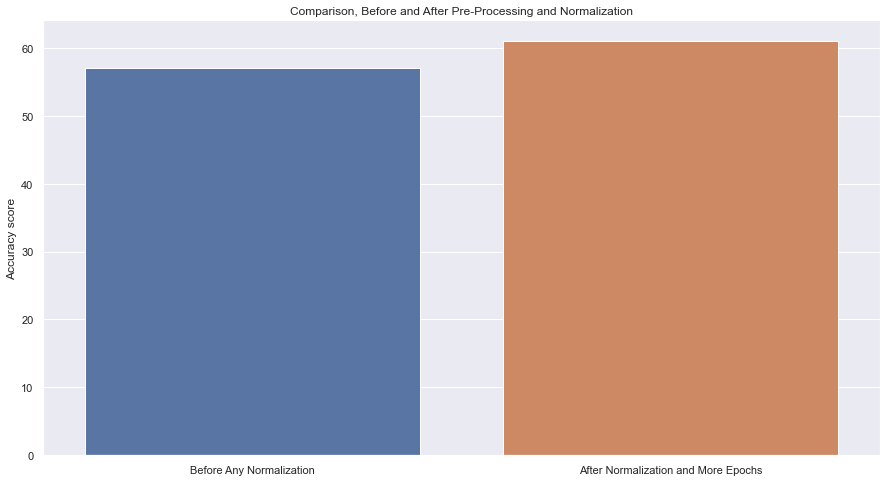

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(rc={'figure.figsize':(15,8)})
plt.ylabel("Accuracy score")
plt.title("Comparison, Before and After Pre-Processing and Normalization")
sns.barplot(col,val)

In [37]:
scores = model.evaluate(X_test, test_y, verbose=0)

In [38]:
print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

accuracy: 60.04%


In [40]:
print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

accuracy: 60.04%


In [47]:
scores = model.evaluate(X_test, test_y, verbose=0)

In [22]:
model1=model
model1

# Using the Original Dataset

In [55]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image

In [82]:
train_dir = "./data"
batch_size = 7

validation_split = 0.3
img_height = 300
img_width = 300
epochs = 10

## Using MixUp to augment our emotion data images: 
The research paper shows that MixUp improves the generalization of state-of-the-art neural network architectures.
        
        
        Reference: https://arxiv.org/pdf/1710.09412.pdf

In [83]:
class MixupImageDataGenerator():
    def __init__(self, generator, directory, batch_size, img_height, img_width, alpha=0.2, subset=None):
        """Constructor for mixup image data generator.

        Arguments:
            generator {object} -- An instance of Keras ImageDataGenerator.
            directory {str} -- Image directory.
            batch_size {int} -- Batch size.
            img_height {int} -- Image height in pixels.
            img_width {int} -- Image width in pixels.

        Keyword Arguments:
            alpha {float} -- Mixup beta distribution alpha parameter. (default: {0.2})
            subset {str} -- 'training' or 'validation' if validation_split is specified in
            `generator` (ImageDataGenerator).(default: {None})
        """

        self.batch_index = 0
        self.batch_size = batch_size
        self.alpha = alpha

        # First iterator yielding tuples of (x, y)
        self.generator1 = generator.flow_from_directory(directory,
                                                        target_size=(
                                                            img_height, img_width),
                                                        class_mode="categorical",
                                                        batch_size=batch_size,
                                                        shuffle=True,
                                                        subset=subset)

        # Second iterator yielding tuples of (x, y)
        self.generator2 = generator.flow_from_directory(directory,
                                                        target_size=(
                                                            img_height, img_width),
                                                        class_mode="categorical",
                                                        batch_size=batch_size,
                                                        shuffle=True,
                                                        subset=subset)

        # Number of images across all classes in image directory.
        self.n = self.generator1.samples

    def reset_index(self):
        """Reset the generator indexes array.
        """

        self.generator1._set_index_array()
        self.generator2._set_index_array()

    def on_epoch_end(self):
        self.reset_index()

    def reset(self):
        self.batch_index = 0

    def __len__(self):
        # round up
        return (self.n + self.batch_size - 1) // self.batch_size

    def get_steps_per_epoch(self):
        """Get number of steps per epoch based on batch size and
        number of images.

        Returns:
            int -- steps per epoch.
        """

        return self.n // self.batch_size

    def __next__(self):
        """Get next batch input/output pair.

        Returns:
            tuple -- batch of input/output pair, (inputs, outputs).
        """

        if self.batch_index == 0:
            self.reset_index()

        current_index = (self.batch_index * self.batch_size) % self.n
        if self.n > current_index + self.batch_size:
            self.batch_index += 1
        else:
            self.batch_index = 0

        # random sample the lambda value from beta distribution.
        l = np.random.beta(self.alpha, self.alpha, self.batch_size)

        X_l = l.reshape(self.batch_size, 1, 1, 1)
        y_l = l.reshape(self.batch_size, 1)

        # Get a pair of inputs and outputs from two iterators.
        X1, y1 = self.generator1.next()
        X2, y2 = self.generator2.next()

        # Perform the mixup.
        X = X1 * X_l + X2 * (1 - X_l)
        y = y1 * y_l + y2 * (1 - y_l)
        return X, y

    def __iter__(self):
        while True:
            yield next(self)


input_imgen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=5,
    width_shift_range=0.05,
    height_shift_range=0,
    shear_range=0.05,
    zoom_range=0,
    brightness_range=(1, 1.3),
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=validation_split)


train_generator = MixupImageDataGenerator(generator=input_imgen,
                                          directory=train_dir,
                                          batch_size=batch_size,
                                          img_height=img_height,
                                          img_width=img_height,
                                          subset='training')

validation_generator = input_imgen.flow_from_directory(train_dir,
                                                       target_size=(
                                                           img_height, img_width),
                                                       class_mode="categorical",
                                                       batch_size=batch_size,
                                                       shuffle=True,
                                                       subset='validation')

Found 5027 images belonging to 7 classes.
Found 5027 images belonging to 7 classes.
Found 2151 images belonging to 7 classes.


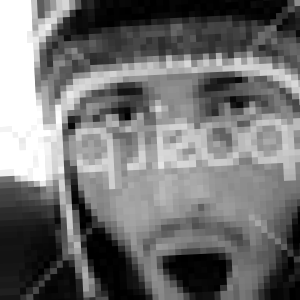

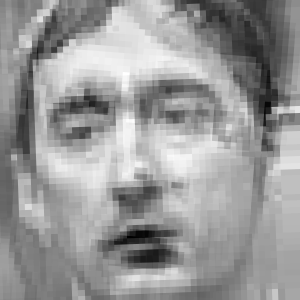

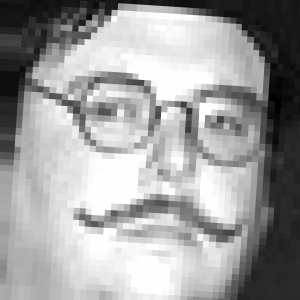

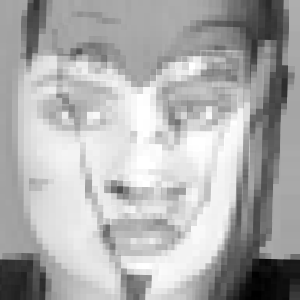

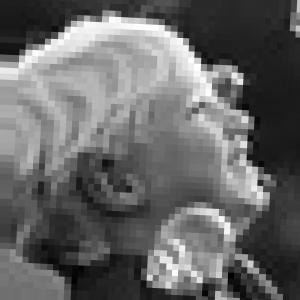

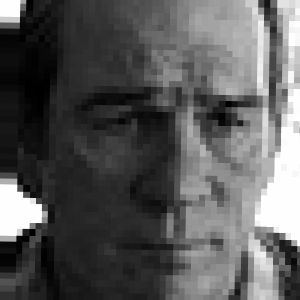

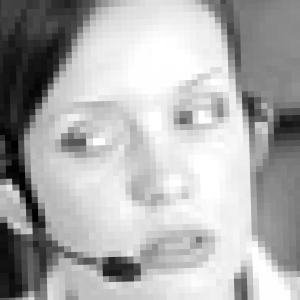

[[0.00000000e+00 0.00000000e+00 1.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 6.54912590e-01 3.45087410e-01]
 [0.00000000e+00 0.00000000e+00 3.84859035e-04 0.00000000e+00
  0.00000000e+00 9.99615141e-01 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  3.82963829e-01 0.00000000e+00 6.17036171e-01]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 9.96439253e-01
  3.56074712e-03 0.00000000e+00 0.00000000e+00]
 [2.34989353e-04 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 9.99765011e-01 0.00000000e+00]
 [1.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00]]


In [84]:
sample_x, sample_y = next(train_generator)
for i in range(batch_size):
    display(image.array_to_img(sample_x[i]))
print(sample_y)

training steps:  718
validation steps:  307


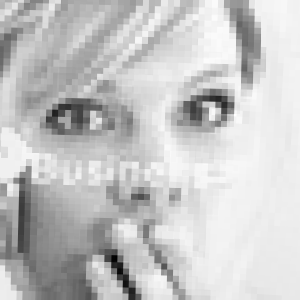

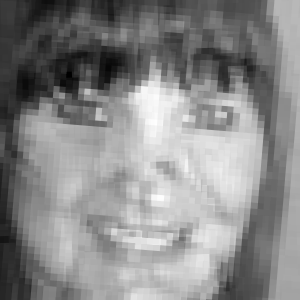

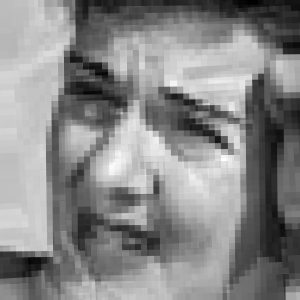

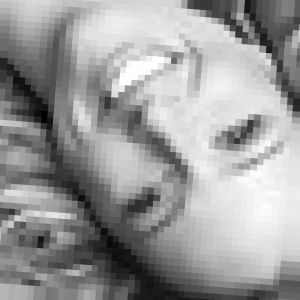

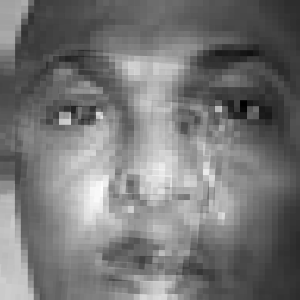

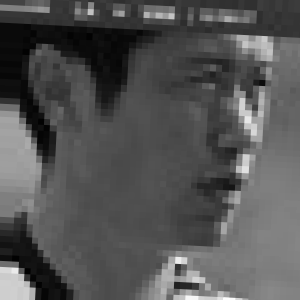

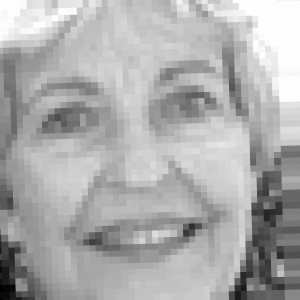

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 1.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 7.50822964e-01
  0.00000000e+00 0.00000000e+00 2.49177036e-01]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 9.99974569e-01
  0.00000000e+00 0.00000000e+00 2.54311702e-05]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  6.77531143e-01 0.00000000e+00 3.22468857e-01]
 [7.74296228e-05 0.00000000e+00 0.00000000e+00 0.00000000e+00
  9.99922570e-01 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 1.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00]]


In [85]:
print('training steps: ', train_generator.get_steps_per_epoch())
print('validation steps: ', validation_generator.samples // batch_size)
for item in train_generator:
    sample_x, sample_y = item
    for i in range(batch_size):
        display(image.array_to_img(sample_x[i]))
    print(sample_y)
    break

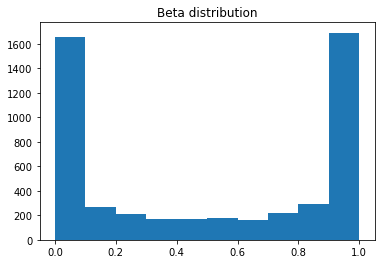

In [86]:
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
alpha = 0.2
array = np.random.beta(alpha, alpha, 5000)
h = sorted(array)  #sorted
fit = stats.norm.pdf(h, np.mean(h), np.std(h))  #this is a fitting indeed
plt.hist(h)
plt.title('Beta distribution')
plt.show()

In [87]:
from tensorflow.keras.applications import VGG16

conv_base = VGG16(weights='imagenet',
                  include_top=False,
                  input_shape=(img_height, img_width, 3))

In [88]:
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras import optimizers

model2 = models.Sequential()
model2.add(conv_base)
model2.add(layers.Flatten())
model2.add(layers.Dense(256, activation='relu'))
model2.add(layers.Dense(7, activation='sigmoid'))

conv_base.trainable = False
model2.compile(optimizer=optimizers.RMSprop(lr=2e-5),
              loss='binary_crossentropy',
              metrics=['acc'])

In [89]:
model2.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 9, 9, 512)         14714688  
                                                                 
 flatten_3 (Flatten)         (None, 41472)             0         
                                                                 
 dense_7 (Dense)             (None, 256)               10617088  
                                                                 
 dense_8 (Dense)             (None, 7)                 1799      
                                                                 
Total params: 25,333,575
Trainable params: 10,618,887
Non-trainable params: 14,714,688
_________________________________________________________________


In [91]:
train_generator.reset()
validation_generator.reset()
# Start the traning.
history = model2.fit_generator(
    train_generator,
    steps_per_epoch=train_generator.get_steps_per_epoch(),
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // batch_size,
    epochs=5)

C:\Users\SSD\AppData\Local\Temp/ipykernel_23448/640632906.py:4: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model2.fit_generator(


Epoch 1/5
718/718 [==============================] - 621s 865ms/step - loss: 0.3584 - acc: 0.3703 - val_loss: 0.3436 - val_acc: 0.3932
Epoch 2/5
718/718 [==============================] - 639s 891ms/step - loss: 0.3381 - acc: 0.4389 - val_loss: 0.3466 - val_acc: 0.4076
Epoch 3/5
718/718 [==============================] - 625s 871ms/step - loss: 0.3323 - acc: 0.4517 - val_loss: 0.3372 - val_acc: 0.3895
Epoch 4/5
718/718 [==============================] - 624s 869ms/step - loss: 0.3269 - acc: 0.4634 - val_loss: 0.3150 - val_acc: 0.4700
Epoch 5/5
718/718 [==============================] - 637s 888ms/step - loss: 0.3247 - acc: 0.4721 - val_loss: 0.3133 - val_acc: 0.4593


## As the Image dataset is taking a lot of Computation power and time to do only 5 epocs, with an Accuracy of less than 50%, we'll now again use the .csv dataset

In [91]:
def preprocess_data():
    data = pd.read_csv('fer2013.csv')
    labels = pd.read_csv('fer2013.csv')

    orig_class_names = ['neutral', 'happiness', 'surprise', 'sadness', 'anger', 'disgust', 'fear', 'contempt',
                        'unknown', 'NF']

    n_samples = len(data)
    w = 48
    h = 48

    y = np.array(labels[orig_class_names])
    X = np.zeros((n_samples, w, h, 1))
    for i in range(n_samples):
        X[i] = np.fromstring(data['pixels'][i], dtype=int, sep=' ').reshape((h, w, 1))

    return X, y

In [92]:
def clean_data_and_normalize(X, y):
    orig_class_names = ['neutral', 'happiness', 'surprise', 'sadness', 'anger', 'disgust', 'fear', 'contempt',
                        'unknown', 'NF']

    # Using mask to remove unknown or NF images
    y_mask = y.argmax(axis=-1)
    mask = y_mask < orig_class_names.index('unknown')
    X = X[mask]
    y = y[mask]

    # Convert to probabilities between 0 and 1
    y = y[:, :-2] * 0.1

    # Add contempt to neutral and remove it
    y[:, 0] += y[:, 7]
    y = y[:, :7]

    # Normalize image vectors
    X = X / 255.0

    return X, y

In [93]:
def split_data(X, y):
    test_size = ceil(len(X) * 0.1)

    # Split Data
    x_train, x_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=test_size, random_state=42)
    x_train, x_val, y_train, y_val = model_selection.train_test_split(x_train, y_train, test_size=test_size,
                                                                      random_state=42)
    return x_train, y_train, x_val, y_val, x_test, y_test


def data_augmentation(x_train):
    shift = 0.1
    datagen = ImageDataGenerator(
        rotation_range=20,
        horizontal_flip=True,
        height_shift_range=shift,
        width_shift_range=shift)
    datagen.fit(x_train)
    return datagen


def show_augmented_images(datagen, x_train, y_train):
    it = datagen.flow(x_train, y_train, batch_size=1)
    plt.figure(figsize=(10, 7))
    for i in range(25):
        plt.subplot(5, 5, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(it.next()[0][0], cmap='gray')
        # plt.xlabel(class_names[y_train[i]])
    plt.show()

## Before we had 3 CNN layers, so now we'll add 5 stages to increase the accuracy

In [94]:
def define_model(input_shape=(48, 48, 1), classes=7):
    num_features = 64

    model = Sequential()

    # 1st stage
    model.add(Conv2D(num_features, kernel_size=(3, 3), input_shape=input_shape))
    model.add(BatchNormalization())
    model.add(Activation(activation='relu'))
    model.add(Conv2D(num_features, kernel_size=(3, 3)))
    model.add(BatchNormalization())
    model.add(Activation(activation='relu'))
    model.add(Dropout(0.5))

    # 2nd stage
    model.add(Conv2D(num_features, (3, 3), activation='relu'))
    model.add(Conv2D(num_features, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    # 3rd stage
    model.add(Conv2D(2 * num_features, kernel_size=(3, 3)))
    model.add(BatchNormalization())
    model.add(Activation(activation='relu'))
    model.add(Conv2D(2 * num_features, kernel_size=(3, 3)))
    model.add(BatchNormalization())
    model.add(Activation(activation='relu'))

    # 4th stage
    model.add(Conv2D(2 * num_features, (3, 3), activation='relu'))
    model.add(Conv2D(2 * num_features, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    # 5th stage
    model.add(Conv2D(4 * num_features, kernel_size=(3, 3)))
    model.add(BatchNormalization())
    model.add(Activation(activation='relu'))
    model.add(Conv2D(4 * num_features, kernel_size=(3, 3)))
    model.add(BatchNormalization())
    model.add(Activation(activation='relu'))

    model.add(Flatten())

    # Fully connected neural networks
    model.add(Dense(1024, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(1024, activation='relu'))
    model.add(Dropout(0.2))

    model.add(Dense(classes, activation='softmax'))

    return model


In [95]:
df

,emotion,pixels,Usage
0,0,70 80 82 72 58 58 60 63 54 58 60 48 89 115 121...,Training
1,0,151 150 147 155 148 133 111 140 170 174 182 15...,Training
2,2,231 212 156 164 174 138 161 173 182 200 106 38...,Training
3,4,24 32 36 30 32 23 19 20 30 41 21 22 32 34 21 1...,Training
4,6,4 0 0 0 0 0 0 0 0 0 0 0 3 15 23 28 48 50 58 84...,Training
...,...,...,...
35882,6,50 36 17 22 23 29 33 39 34 37 37 37 39 43 48 5...,PrivateTest
35883,3,178 174 172 173 181 188 191 194 196 199 200 20...,PrivateTest
35884,0,17 17 16 23 28 22 19 17 25 26 20 24 31 19 27 9...,PrivateTest
35885,3,30 28 28 29 31 30 42 68 79 81 77 67 67 71 63 6...,PrivateTest


In [96]:
emotion_label_to_text = {0:'anger', 1:'disgust', 2:'fear', 3:'happiness', 4: 'sadness', 5: 'surprise', 6: 'neutral'}

In [97]:
df.emotion.value_counts()

3    8989
6    6198
4    6077
2    5121
0    4953
5    4002
1     547
Name: emotion, dtype: int64

C:\Users\SSD\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


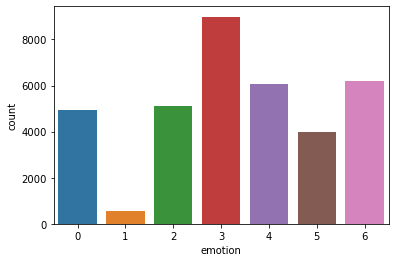

In [98]:
import seaborn as sns
from matplotlib import pyplot
sns.countplot(df.emotion)
pyplot.show()

## It can be observed that Majority of the classes/images belong to anger, fear, Happy, Sad, Surprise, Neutral

In [99]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report

In [100]:
from tensorflow.keras import optimizers
from tensorflow.keras.datasets import mnist
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, Conv2D, MaxPooling2D
from tensorflow.keras.layers import Dropout, BatchNormalization, LeakyReLU, Activation
from tensorflow.keras.callbacks import Callback, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from keras.utils import np_utils

In [101]:
import math
math.sqrt(len(df.pixels[0].split(' ')))

48.0

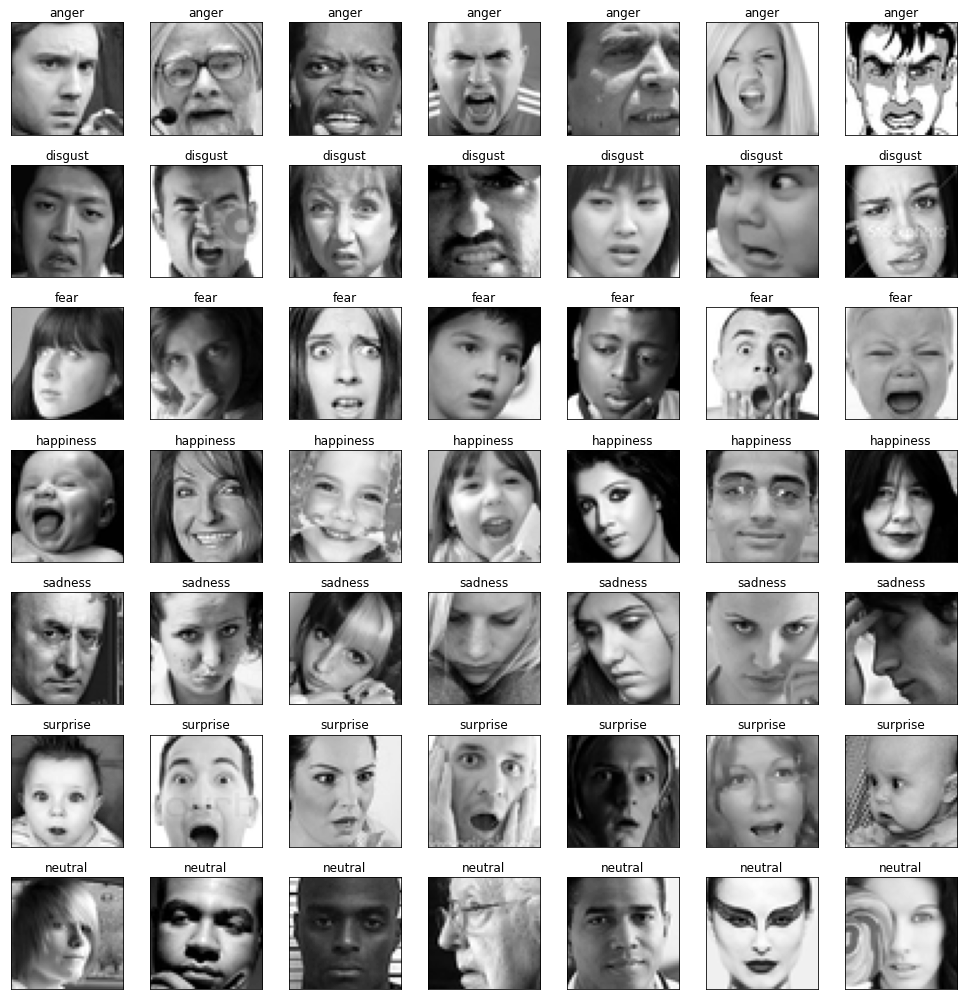

In [102]:
fig = pyplot.figure(1, (14, 14))

k = 0
for label in sorted(df.emotion.unique()):
    for j in range(7):
        px = df[df.emotion==label].pixels.iloc[k]
        px = np.array(px.split(' ')).reshape(48, 48).astype('float32')

        k += 1
        ax = pyplot.subplot(7, 7, k)
        ax.imshow(px, cmap='gray')
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title(emotion_label_to_text[label])
        pyplot.tight_layout()

## Now, due to the limitations of the datasets, we'll consider the main Emotions only, and then apply for all.

In [103]:
INTERESTED_LABELS = [3, 4, 6]

In [104]:
df1 = df[df.emotion.isin(INTERESTED_LABELS)]
df1.shape

(21264, 3)

## Making it compatible for Neural Networks

In [105]:
img_array = df1.pixels.apply(lambda x: np.array(x.split(' ')).reshape(48, 48, 1).astype('float32'))
img_array = np.stack(img_array, axis=0)

In [106]:
img_array.shape

(21264, 48, 48, 1)

In [107]:
le = LabelEncoder()
img_labels = le.fit_transform(df1.emotion)
img_labels = np_utils.to_categorical(img_labels)
img_labels.shape

(21264, 3)

In [108]:
le_name_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print(le_name_mapping)

{3: 0, 4: 1, 6: 2}


In [109]:
X_train, X_valid, y_train, y_valid = train_test_split(img_array, img_labels,
                                                    shuffle=True, stratify=img_labels,
                                                    test_size=0.1, random_state=42)
X_train.shape, X_valid.shape, y_train.shape, y_valid.shape

((19137, 48, 48, 1), (2127, 48, 48, 1), (19137, 3), (2127, 3))

In [110]:
img_width = X_train.shape[1]
img_height = X_train.shape[2]
img_depth = X_train.shape[3]
num_classes = y_train.shape[1]

In [111]:
# Normalizing results, as neural networks are very sensitive to unnormalized data.
X_train = X_train / 255.
X_valid = X_valid / 255.

Adding Deep CNN as well, and using ELU insead of 'RELU' because it avoids dying relu problem.

In [112]:
def build_net(optim):
    """
    This is a Deep Convolutional Neural Network (DCNN). For generalization purpose, we've used dropouts in regular intervals.
    We used `ELU` as the activation because it avoids dying relu problem but also performed well as compared to LeakyRelu
    atleast in this case. `he_normal` kernel initializer is used as it suits ELU. BatchNormalization is also used for better
    results.
    """
    net = Sequential(name='DCNN')

    net.add(
        Conv2D(
            filters=64,
            kernel_size=(5,5),
            input_shape=(img_width, img_height, img_depth),
            activation='elu',
            padding='same',
            kernel_initializer='he_normal',
            name='conv2d_1'
        )
    )
    net.add(BatchNormalization(name='batchnorm_1'))
    net.add(
        Conv2D(
            filters=64,
            kernel_size=(5,5),
            activation='elu',
            padding='same',
            kernel_initializer='he_normal',
            name='conv2d_2'
        )
    )
    net.add(BatchNormalization(name='batchnorm_2'))
    net.add(MaxPooling2D(pool_size=(2,2), name='maxpool2d_1'))
    net.add(Dropout(0.4, name='dropout_1'))

    net.add(
        Conv2D(
            filters=128,
            kernel_size=(3,3),
            activation='elu',
            padding='same',
            kernel_initializer='he_normal',
            name='conv2d_3'
        )
    )
    net.add(BatchNormalization(name='batchnorm_3'))
    net.add(
        Conv2D(
            filters=128,
            kernel_size=(3,3),
            activation='elu',
            padding='same',
            kernel_initializer='he_normal',
            name='conv2d_4'
        )
    )
    net.add(BatchNormalization(name='batchnorm_4'))
    
    net.add(MaxPooling2D(pool_size=(2,2), name='maxpool2d_2'))
    net.add(Dropout(0.4, name='dropout_2'))

    net.add(
        Conv2D(
            filters=256,
            kernel_size=(3,3),
            activation='elu',
            padding='same',
            kernel_initializer='he_normal',
            name='conv2d_5'
        )
    )
    net.add(BatchNormalization(name='batchnorm_5'))
    net.add(
        Conv2D(
            filters=256,
            kernel_size=(3,3),
            activation='elu',
            padding='same',
            kernel_initializer='he_normal',
            name='conv2d_6'
        )
    )
    net.add(BatchNormalization(name='batchnorm_6'))
    
    net.add(MaxPooling2D(pool_size=(2,2), name='maxpool2d_3'))
    net.add(Dropout(0.5, name='dropout_3'))

    net.add(Flatten(name='flatten'))
        
    net.add(
        Dense(
            128,
            activation='elu',
            kernel_initializer='he_normal',
            name='dense_1'
        )
    )
    net.add(BatchNormalization(name='batchnorm_7'))
    net.add(Dropout(0.6, name='dropout_4'))
    net.add(
        Dense(
            num_classes,
            activation='softmax',
            name='out_layer'
        )
    )
    
    net.compile(
        loss='categorical_crossentropy',
        optimizer=optim,
        metrics=['accuracy']
    )
    net.summary()
    return net

# To avoid Overfitting: 

In [113]:
early_stopping = EarlyStopping(
    monitor='val_accuracy',
    min_delta=0.00005,
    patience=11,
    verbose=1,
    restore_best_weights=True,
)

lr_scheduler = ReduceLROnPlateau(
    monitor='val_accuracy',
    factor=0.5,
    patience=7,
    min_lr=1e-7,
    verbose=1,
)

callbacks = [
    early_stopping,
    lr_scheduler,
]

In [114]:
train_datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.15,
    height_shift_range=0.15,
    shear_range=0.15,
    zoom_range=0.15,
    horizontal_flip=True,
)
train_datagen.fit(X_train)

## Initially we did 20,30 epochs, so now directly doing 100 epochs and using The early stopping to avoid Over-Fitting

In [ ]:
batch_size = 32 #batch size of 32 performs the best.
epochs = 5
optims = [
    optimizers.Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, name='Nadam'),
    optimizers.Adam(0.001),
]

model3 = build_net(optims[1]) 
history = model3.fit_generator(
    train_datagen.flow(X_train, y_train, batch_size=batch_size),
    validation_data=(X_valid, y_valid),
    steps_per_epoch=len(X_train) / batch_size,
    epochs=epochs,
    callbacks=callbacks,
    use_multiprocessing=True
)

Model: "DCNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 48, 48, 64)        1664      
                                                                 
 batchnorm_1 (BatchNormaliza  (None, 48, 48, 64)       256       
 tion)                                                           
                                                                 
 conv2d_2 (Conv2D)           (None, 48, 48, 64)        102464    
                                                                 
 batchnorm_2 (BatchNormaliza  (None, 48, 48, 64)       256       
 tion)                                                           
                                                                 
 maxpool2d_1 (MaxPooling2D)  (None, 24, 24, 64)        0         
                                                                 
 dropout_1 (Dropout)         (None, 24, 24, 64)        0      

C:\Users\SSD\AppData\Local\Temp/ipykernel_33640/110767433.py:9: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model3.fit_generator(
Exception in thread Thread-9:
Traceback (most recent call last):
  File "C:\Users\SSD\anaconda3\lib\threading.py", line 973, in _bootstrap_inner
    self.run()
  File "C:\Users\SSD\anaconda3\lib\threading.py", line 910, in run
    self._target(*self._args, **self._kwargs)
  File "C:\Users\SSD\anaconda3\lib\site-packages\keras\utils\data_utils.py", line 745, in _run
    with closing(self.executor_fn(_SHARED_SEQUENCES)) as executor:
  File "C:\Users\SSD\anaconda3\lib\site-packages\keras\utils\data_utils.py", line 722, in pool_fn
    pool = get_pool_class(True)(
  File "C:\Users\SSD\anaconda3\lib\multiprocessing\context.py", line 119, in Pool
    return Pool(processes, initializer, initargs, maxtasksperchild,
  File "C:\Users\SSD\anaconda3\lib\multiproce

We've tried both `Nadam` and `Adam`, the difference in results is not that different but we chose Nadam as we've tried Adam optimizer before.

In [250]:
import os
from keras.preprocessing.image import ImageDataGenerator, load_img
from keras.layers import Conv2D, Dense, BatchNormalization, Activation, Dropout, MaxPooling2D, Flatten
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
from keras import regularizers
from keras.callbacks import ModelCheckpoint, CSVLogger, TensorBoard, EarlyStopping, ReduceLROnPlateau
import datetime
import matplotlib.pyplot as plt
from tensorflow.keras.utils import plot_model

In [251]:
train_dir = "./data/train"
train_dir = './data/train'
test_dir = './data/test/'

In [92]:
row, col = 48, 48
classes = 7

def count_exp(path, set_):
    dict_ = {}
    for expression in os.listdir(path):
        dir_ = path +"/" +expression
        dict_[expression] = len(os.listdir(dir_))
    df = pd.DataFrame(dict_, index=[set_])
    return df
train_count = count_exp(train_dir, 'train')
test_count = count_exp(test_dir, 'test')
print(train_count)
print(test_count)

       angry  disgust  fear  happy  neutral   sad  surprise
train   3995      436  4097   7215     4965  4830      3171
      angry  disgust  fear  happy  neutral   sad  surprise
test    958      111  1024   1774     1233  1247       831


<AxesSubplot:>

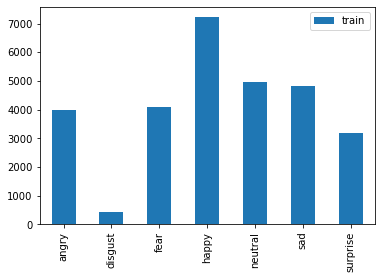

In [93]:
train_count.transpose().plot(kind='bar')

<AxesSubplot:>

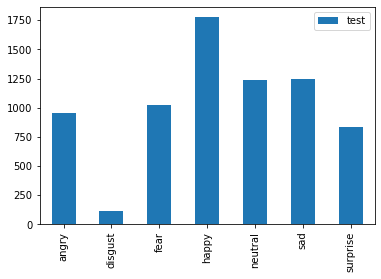

In [95]:
#Test Images
test_count.transpose().plot(kind='bar')

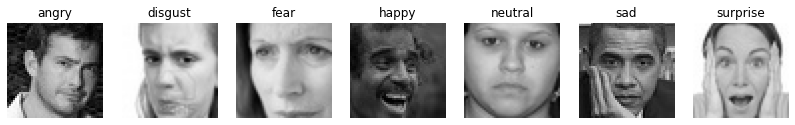

In [98]:
plt.figure(figsize=(14,22))
i = 1
for expression in os.listdir(train_dir):
    img = load_img((train_dir +'/'+ expression +'/'+ os.listdir(train_dir +'/'+ expression)[1]))
    plt.subplot(1,7,i)
    plt.imshow(img)
    plt.title(expression)
    plt.axis('off')
    i += 1
plt.show()

In [99]:
## For our confirmation, converting to grayscale
train_datagen = ImageDataGenerator(rescale=1./255,
                                   zoom_range=0.3,
                                   horizontal_flip=True)

training_set = train_datagen.flow_from_directory(train_dir,
                                                batch_size=64,
                                                target_size=(48,48),
                                                shuffle=True,
                                                color_mode='grayscale',
                                                class_mode='categorical')

test_datagen = ImageDataGenerator(rescale=1./255)
test_set = test_datagen.flow_from_directory(test_dir,
                                                batch_size=64,
                                                target_size=(48,48),
                                                shuffle=True,
                                                color_mode='grayscale',
                                                class_mode='categorical')

Found 28709 images belonging to 7 classes.
Found 7178 images belonging to 7 classes.


In [100]:
training_set.class_indices

{'angry': 0,
 'disgust': 1,
 'fear': 2,
 'happy': 3,
 'neutral': 4,
 'sad': 5,
 'surprise': 6}

## Creating the model using kernel_regularizer

In [254]:
def get_model(input_size, classes=7):
     #Initialising the CNN
    model = tf.keras.models.Sequential()   

    model.add(Conv2D(32, kernel_size=(3, 3), padding='same', activation='relu', input_shape =input_size))
    model.add(Conv2D(64, kernel_size=(3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(2, 2))
    model.add(Dropout(0.25))

    model.add(Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(0.01)))
    model.add(Conv2D(256, kernel_size=(3, 3), activation='relu', kernel_regularizer=regularizers.l2(0.01)))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Flatten())
    model.add(Dense(1024, activation='relu'))
    model.add(Dropout(0.5))
    
    model.add(Dense(classes, activation='softmax'))

    #Compliling the model
    model.compile(optimizer=Adam(lr=0.0001, decay=1e-6), 
                  loss='categorical_crossentropy', 
                  metrics=['accuracy'])
    return model

In [255]:
fernet = get_model((row,col,1), classes)
fernet.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_32 (Conv2D)          (None, 48, 48, 32)        320       
                                                                 
 conv2d_33 (Conv2D)          (None, 48, 48, 64)        18496     
                                                                 
 batch_normalization (BatchN  (None, 48, 48, 64)       256       
 ormalization)                                                   
                                                                 
 max_pooling2d_11 (MaxPoolin  (None, 24, 24, 64)       0         
 g2D)                                                            
                                                                 
 dropout_9 (Dropout)         (None, 24, 24, 64)        0         
                                                                 
 conv2d_34 (Conv2D)          (None, 24, 24, 128)      

In [104]:
# Plotting our Model

In [107]:
plot_model(fernet, to_file='fernet.png', show_shapes=True, show_layer_names=True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model/model_to_dot to work.


In [109]:
pip install graphviz

In [256]:
chk_path = 'ferNet.h5'
log_dir = "checkpoint/logs/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

checkpoint = ModelCheckpoint(filepath=chk_path,
                             save_best_only=True,
                             verbose=1,
                             mode='min',
                             moniter='val_loss')

earlystop = EarlyStopping(monitor='val_loss', 
                          min_delta=0, 
                          patience=3, 
                          verbose=1, 
                          restore_best_weights=True)
                        
reduce_lr = ReduceLROnPlateau(monitor='val_loss', 
                              factor=0.2, 
                              patience=6, 
                              verbose=1, 
                              min_delta=0.0001)


tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
csv_logger = CSVLogger('training.log')

callbacks = [checkpoint, reduce_lr, csv_logger]

In [118]:
steps_per_epoch = training_set.n // training_set.batch_size
validation_steps = test_set.n // test_set.batch_size

hist = fernet.fit(x=training_set,
                 validation_data=test_set,
                 epochs=10,
                 callbacks=callbacks,
                 steps_per_epoch=steps_per_epoch,
                 validation_steps=validation_steps)

Epoch 1/10
448/448 [==============================] - ETA: 0s - loss: 2.4064 - accuracy: 0.4216
Epoch 1: val_loss improved from 2.49701 to 2.15205, saving model to ferNet.h5
448/448 [==============================] - 136s 301ms/step - loss: 2.4064 - accuracy: 0.4216 - val_loss: 2.1521 - val_accuracy: 0.4641 - lr: 1.0000e-04
Epoch 2/10
448/448 [==============================] - ETA: 0s - loss: 2.1116 - accuracy: 0.4466
Epoch 2: val_loss improved from 2.15205 to 1.87376, saving model to ferNet.h5
448/448 [==============================] - 129s 287ms/step - loss: 2.1116 - accuracy: 0.4466 - val_loss: 1.8738 - val_accuracy: 0.5059 - lr: 1.0000e-04
Epoch 3/10
448/448 [==============================] - ETA: 0s - loss: 1.8942 - accuracy: 0.4680
Epoch 3: val_loss improved from 1.87376 to 1.73300, saving model to ferNet.h5
448/448 [==============================] - 128s 286ms/step - loss: 1.8942 - accuracy: 0.4680 - val_loss: 1.7330 - val_accuracy: 0.5018 - lr: 1.0000e-04
Epoch 4/10
448/448 [==

# Plotting the  accuracy and loss

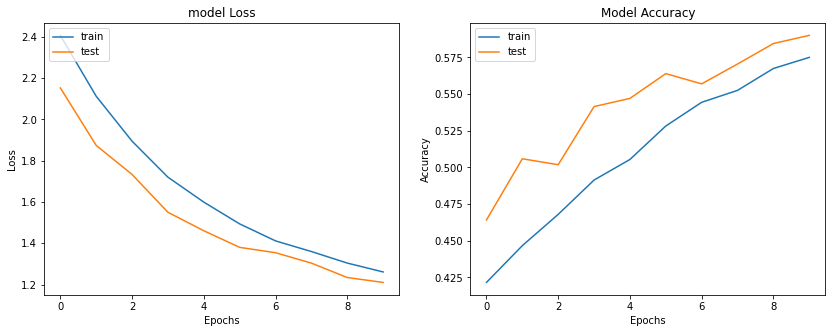

In [119]:
plt.figure(figsize=(14,5))
plt.subplot(1,2,2)
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(['train', 'test'], loc='upper left')

plt.subplot(1,2,1)
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

### High accracy is achieved on training set but accuracy on validation set is stuck at 60-70%, also no overfitting can be seen in the dataset hence it can be concluded that the inefficiency may be due to the unbalanced dataset

In [257]:
### Again Evaluating our new model
train_loss, train_accu = fernet.evaluate(training_set)
test_loss, test_accu = fernet.evaluate(test_set)
print("final train accuracy = {:.2f} , validation accuracy = {:.2f}".format(train_accu*100, test_accu*100))

113/113 [==============================] - 7s 64ms/step - loss: 4.5061 - accuracy: 0.0763
final train accuracy = 7.41 , validation accuracy = 7.63


In [258]:
fernet.save_weights('fernet_bestSSD.h5')

## Confusion Matrix and Classification on training set

Confusion Matrix
[[ 481   11  308 1420  598  746  431]
 [  76    1   31  137   67   82   42]
 [ 534   10  346 1420  637  734  416]
 [ 932   25  543 2510 1116 1299  790]
 [ 608   15  399 1770  733  921  519]
 [ 611   15  387 1699  755  857  506]
 [ 420    7  250 1096  495  535  368]]
Classification Report
              precision    recall  f1-score   support

       angry       0.13      0.12      0.13      3995
     disgust       0.01      0.00      0.00       436
        fear       0.15      0.08      0.11      4097
       happy       0.25      0.35      0.29      7215
     neutral       0.17      0.15      0.16      4965
         sad       0.17      0.18      0.17      4830
    surprise       0.12      0.12      0.12      3171

    accuracy                           0.18     28709
   macro avg       0.14      0.14      0.14     28709
weighted avg       0.17      0.18      0.18     28709



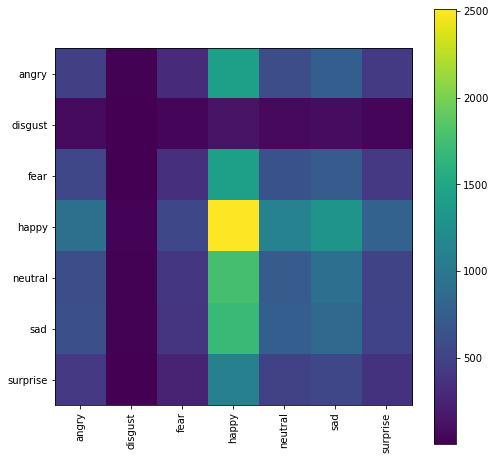

In [122]:
y_pred = fernet.predict(training_set)
y_pred = np.argmax(y_pred, axis=1)
class_labels = test_set.class_indices
class_labels = {v:k for k,v in class_labels.items()}

from sklearn.metrics import classification_report, confusion_matrix
cm_train = confusion_matrix(training_set.classes, y_pred)
print('Confusion Matrix')
print(cm_train)
print('Classification Report')
target_names = list(class_labels.values())
print(classification_report(training_set.classes, y_pred, target_names=target_names))

plt.figure(figsize=(8,8))
plt.imshow(cm_train, interpolation='nearest')
plt.colorbar()
tick_mark = np.arange(len(target_names))
_ = plt.xticks(tick_mark, target_names, rotation=90)
_ = plt.yticks(tick_mark, target_names)

## For Test set

Confusion Matrix
[[133   4  85 286 157 176 117]
 [ 13   0  11  34  21  16  16]
 [136   6  96 328 187 156 115]
 [219   4 131 595 321 284 220]
 [155   1 109 418 221 190 139]
 [165   4 106 427 236 191 118]
 [100   1  81 266 142 140 101]]
Classification Report
              precision    recall  f1-score   support

       angry       0.14      0.14      0.14       958
     disgust       0.00      0.00      0.00       111
        fear       0.16      0.09      0.12      1024
       happy       0.25      0.34      0.29      1774
     neutral       0.17      0.18      0.18      1233
         sad       0.17      0.15      0.16      1247
    surprise       0.12      0.12      0.12       831

    accuracy                           0.19      7178
   macro avg       0.14      0.15      0.14      7178
weighted avg       0.18      0.19      0.18      7178



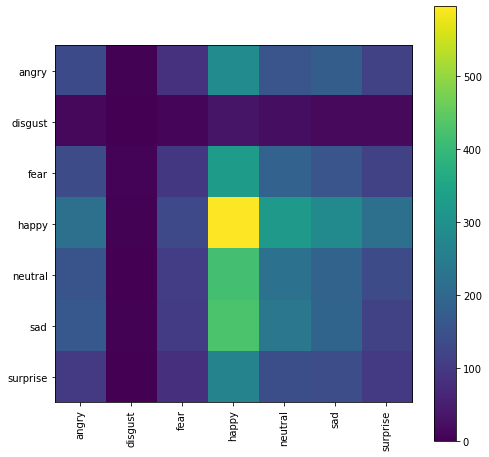

In [123]:
y_pred = fernet.predict(test_set)
y_pred = np.argmax(y_pred, axis=1)
class_labels = test_set.class_indices
class_labels = {v:k for k,v in class_labels.items()}

#from sklearn.metrics import classification_report, confusion_matrix
cm_test = confusion_matrix(test_set.classes, y_pred)
print('Confusion Matrix')
print(cm_test)
print('Classification Report')
target_names = list(class_labels.values())
print(classification_report(test_set.classes, y_pred, target_names=target_names))

plt.figure(figsize=(8,8))
plt.imshow(cm_test, interpolation='nearest')
plt.colorbar()
tick_mark = np.arange(len(target_names))
_ = plt.xticks(tick_mark, target_names, rotation=90)
_ = plt.yticks(tick_mark, target_names)

# Adding more layers

In [259]:
def define_model(input_shape=(48, 48, 1), classes=7):
    num_features = 64

    model = Sequential()

    # 1st stage
    model.add(Conv2D(num_features, kernel_size=(3, 3), input_shape=input_shape))
    model.add(BatchNormalization())
    model.add(Activation(activation='relu'))
    model.add(Conv2D(num_features, kernel_size=(3, 3)))
    model.add(BatchNormalization())
    model.add(Activation(activation='relu'))
    model.add(Dropout(0.5))

    # 2nd stage
    model.add(Conv2D(num_features, (3, 3), activation='relu'))
    model.add(Conv2D(num_features, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    # 3rd stage
    model.add(Conv2D(2 * num_features, kernel_size=(3, 3)))
    model.add(BatchNormalization())
    model.add(Activation(activation='relu'))
    model.add(Conv2D(2 * num_features, kernel_size=(3, 3)))
    model.add(BatchNormalization())
    model.add(Activation(activation='relu'))

    # 4th stage
    model.add(Conv2D(2 * num_features, (3, 3), activation='relu'))
    model.add(Conv2D(2 * num_features, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    # 5th stage
    model.add(Conv2D(4 * num_features, kernel_size=(3, 3)))
    model.add(BatchNormalization())
    model.add(Activation(activation='relu'))
    model.add(Conv2D(4 * num_features, kernel_size=(3, 3)))
    model.add(BatchNormalization())
    model.add(Activation(activation='relu'))

    model.add(Flatten())

    # Fully connected neural networks
    model.add(Dense(1024, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(1024, activation='relu'))
    model.add(Dropout(0.2))

    model.add(Dense(classes, activation='softmax'))

    #return model

    #Compliling the model
    model.compile(optimizer=Adam(lr=0.0001, decay=1e-6), 
                  loss='categorical_crossentropy', 
                  metrics=['accuracy'])
    return model

In [125]:
fernet1 = define_model((row,col,1), classes)
fernet1.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_14 (Conv2D)          (None, 46, 46, 64)        640       
                                                                 
 batch_normalization_8 (Batc  (None, 46, 46, 64)       256       
 hNormalization)                                                 
                                                                 
 activation_6 (Activation)   (None, 46, 46, 64)        0         
                                                                 
 conv2d_15 (Conv2D)          (None, 44, 44, 64)        36928     
                                                                 
 batch_normalization_9 (Batc  (None, 44, 44, 64)       256       
 hNormalization)                                                 
                                                                 
 activation_7 (Activation)   (None, 44, 44, 64)       

C:\Users\SSD\anaconda3\lib\site-packages\keras\optimizer_v2\adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [126]:
plot_model(fernet1, to_file='Plot_SSD.png', show_shapes=True, show_layer_names=True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model/model_to_dot to work.


In [130]:
pip install graphviz

Note: you may need to restart the kernel to use updated packages.


In [261]:
fernet2 = define_model((row,col,1), classes)
fernet2.summary()
from keras.models import Sequential
from keras.layers import Dense
from keras.utils.vis_utils import plot_model

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_46 (Conv2D)          (None, 46, 46, 64)        640       
                                                                 
 batch_normalization_8 (Batc  (None, 46, 46, 64)       256       
 hNormalization)                                                 
                                                                 
 activation_6 (Activation)   (None, 46, 46, 64)        0         
                                                                 
 conv2d_47 (Conv2D)          (None, 44, 44, 64)        36928     
                                                                 
 batch_normalization_9 (Batc  (None, 44, 44, 64)       256       
 hNormalization)                                                 
                                                                 
 activation_7 (Activation)   (None, 44, 44, 64)       

In [132]:
from keras.models import Sequential
from keras.layers import Dense
from keras.utils.vis_utils import plot_model
plot_model(fernet1, to_file='SSDmodel_plot.png', show_shapes=True, show_layer_names=True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model/model_to_dot to work.


In [262]:
chk_path = 'ferNet.h5'
log_dir = "checkpoint/logs/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

checkpoint = ModelCheckpoint(filepath=chk_path,
                             save_best_only=True,
                             verbose=1,
                             mode='min',
                             moniter='val_loss')

earlystop = EarlyStopping(monitor='val_loss', 
                          min_delta=0, 
                          patience=3, 
                          verbose=1, 
                          restore_best_weights=True)
                        
reduce_lr = ReduceLROnPlateau(monitor='val_loss', 
                              factor=0.2, 
                              patience=6, 
                              verbose=1, 
                              min_delta=0.0001)


tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
csv_logger = CSVLogger('training.log')

callbacks = [checkpoint, reduce_lr, csv_logger]

In [134]:
steps_per_epoch = training_set.n // training_set.batch_size
validation_steps = test_set.n // test_set.batch_size

hist = fernet1.fit(x=training_set,
                 validation_data=test_set,
                 epochs=10,
                 callbacks=callbacks,
                 steps_per_epoch=steps_per_epoch,
                 validation_steps=validation_steps)

Epoch 1/10
448/448 [==============================] - ETA: 0s - loss: 1.7501 - accuracy: 0.2925
Epoch 1: val_loss improved from inf to 2.04533, saving model to ferNet.h5
448/448 [==============================] - 40s 82ms/step - loss: 1.7501 - accuracy: 0.2925 - val_loss: 2.0453 - val_accuracy: 0.1783 - lr: 1.0000e-04
Epoch 2/10
448/448 [==============================] - ETA: 0s - loss: 1.5897 - accuracy: 0.3750
Epoch 2: val_loss improved from 2.04533 to 1.54167, saving model to ferNet.h5
448/448 [==============================] - 34s 75ms/step - loss: 1.5897 - accuracy: 0.3750 - val_loss: 1.5417 - val_accuracy: 0.4030 - lr: 1.0000e-04
Epoch 3/10
448/448 [==============================] - ETA: 0s - loss: 1.4946 - accuracy: 0.4160
Epoch 3: val_loss improved from 1.54167 to 1.39324, saving model to ferNet.h5
448/448 [==============================] - 35s 78ms/step - loss: 1.4946 - accuracy: 0.4160 - val_loss: 1.3932 - val_accuracy: 0.4598 - lr: 1.0000e-04
Epoch 4/10
448/448 [============

In [135]:
steps_per_epoch = training_set.n // training_set.batch_size
validation_steps = test_set.n // test_set.batch_size

hist = fernet1.fit(x=training_set,
                 validation_data=test_set,
                 epochs=20,
                 callbacks=callbacks,
                 steps_per_epoch=steps_per_epoch,
                 validation_steps=validation_steps)

Epoch 1/20
448/448 [==============================] - ETA: 0s - loss: 1.1447 - accuracy: 0.5614
Epoch 1: val_loss did not improve from 1.17593
448/448 [==============================] - 48s 107ms/step - loss: 1.1447 - accuracy: 0.5614 - val_loss: 1.1887 - val_accuracy: 0.5536 - lr: 1.0000e-04
Epoch 2/20
448/448 [==============================] - ETA: 0s - loss: 1.1141 - accuracy: 0.5783
Epoch 2: val_loss improved from 1.17593 to 1.16528, saving model to ferNet.h5
448/448 [==============================] - 44s 98ms/step - loss: 1.1141 - accuracy: 0.5783 - val_loss: 1.1653 - val_accuracy: 0.5582 - lr: 1.0000e-04
Epoch 3/20
448/448 [==============================] - ETA: 0s - loss: 1.0928 - accuracy: 0.5857
Epoch 3: val_loss did not improve from 1.16528
448/448 [==============================] - 39s 88ms/step - loss: 1.0928 - accuracy: 0.5857 - val_loss: 1.1852 - val_accuracy: 0.5635 - lr: 1.0000e-04
Epoch 4/20
448/448 [==============================] - ETA: 0s - loss: 1.0782 - accuracy: 

In [263]:
steps_per_epoch = training_set.n // training_set.batch_size
validation_steps = test_set.n // test_set.batch_size

hist = fernet2.fit(x=training_set,
                 validation_data=test_set,
                 epochs=10,
                 callbacks=callbacks,
                 steps_per_epoch=steps_per_epoch,
                 validation_steps=validation_steps)

Epoch 1/10
448/448 [==============================] - ETA: 0s - loss: 1.7354 - accuracy: 0.2974
Epoch 1: val_loss improved from inf to 2.13784, saving model to ferNet.h5
448/448 [==============================] - 61s 126ms/step - loss: 1.7354 - accuracy: 0.2974 - val_loss: 2.1378 - val_accuracy: 0.1737 - lr: 1.0000e-04
Epoch 2/10
448/448 [==============================] - ETA: 0s - loss: 1.5817 - accuracy: 0.3805
Epoch 2: val_loss improved from 2.13784 to 1.53622, saving model to ferNet.h5
448/448 [==============================] - 48s 107ms/step - loss: 1.5817 - accuracy: 0.3805 - val_loss: 1.5362 - val_accuracy: 0.4025 - lr: 1.0000e-04
Epoch 3/10
448/448 [==============================] - ETA: 0s - loss: 1.4925 - accuracy: 0.4191
Epoch 3: val_loss improved from 1.53622 to 1.51605, saving model to ferNet.h5
448/448 [==============================] - 45s 101ms/step - loss: 1.4925 - accuracy: 0.4191 - val_loss: 1.5161 - val_accuracy: 0.4230 - lr: 1.0000e-04
Epoch 4/10
448/448 [=========

In [190]:
df = pd.read_csv('fer2013.csv')

In [191]:
data = df.values
print (data.shape)

(35887, 3)


In [192]:
#Pre-Processing
y = data[:, 0]
pixels = data[:, 1]
print (type(pixels))
print (len(pixels[0]))
print (pixels[10][10])

<class 'numpy.ndarray'>
8287
3


In [193]:
X = np.zeros((pixels.shape[0], 48*48))

for ix in range(X.shape[0]):
    p = pixels[ix].split(' ')
    for iy in range(X.shape[1]):
        X[ix, iy] = int(p[iy])

In [194]:
x = X

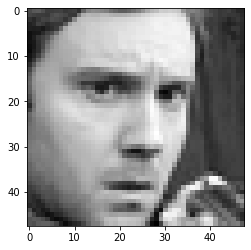

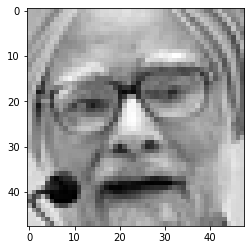

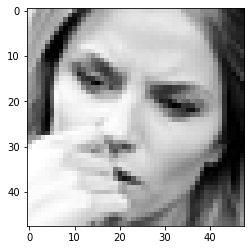

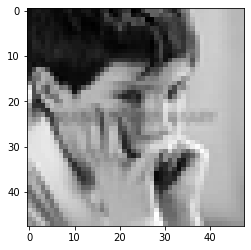

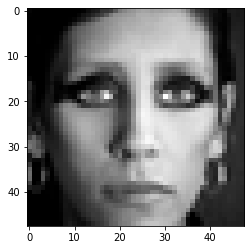

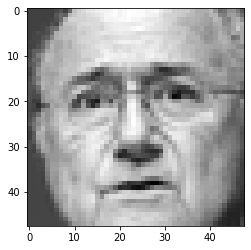

In [139]:
for ix in range(6):
    plt.figure(ix)
    plt.imshow(x[ix].reshape((48, 48)), interpolation='none', cmap='gray')
plt.show()

In [ ]:
## Dividing data into training and cross validation 

In [195]:
x = x / 255
X_train = x[0:28710, :]
Y_train = y[0:28710]
print (X_train.shape, Y_train.shape)
X_crossval = x[28710:32300, :]
Y_crossval = y[28710:32300]
print (X_crossval.shape, Y_crossval.shape)

(28710, 2304) (28710,)
(3590, 2304) (3590,)


In [196]:
X_train = X_train.reshape((X_train.shape[0], 48, 48, 1 ))
X_crossval = X_crossval.reshape((X_crossval.shape[0], 48 ,48, 1))

In [142]:
print (y.shape)
y_ = np_utils.to_categorical(y, 7)
print (y_.shape)

(35887,)
(35887, 7)


In [197]:
Y_train = y_[:28710]
Y_crossval = y_[28710:32300]
print (X_crossval.shape, Y_crossval.shape)

(3590, 48, 48, 1) (3590, 7)


In [ ]:
## Since we have limited computaiton power,we are using this

In [149]:
datagen = ImageDataGenerator(
        rotation_range=10,  
        zoom_range = 0.1,  
        width_shift_range=0.1,  
        height_shift_range=0.1,  
        )  

datagen.fit(X_train)

In [ ]:
# THis time using another optimizer

In [150]:
## Training again
from keras.layers import Input,InputLayer, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D
from keras.layers import AveragePooling2D, MaxPooling2D, Dropout
from keras.models import Sequential,Model
from tensorflow.keras.optimizers import SGD
from keras.callbacks import ModelCheckpoint,LearningRateScheduler
import keras
from keras import backend as K

In [151]:
model = Sequential()

model.add(Conv2D(32, (3, 3), activation='relu', padding="same", input_shape=(48,48,1)))
model.add(Conv2D(32, (3, 3), padding="same", activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu', padding="same"))
model.add(Conv2D(64, (3, 3), padding="same", activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(96, (3, 3), dilation_rate=(2, 2), activation='relu', padding="same"))
model.add(Conv2D(96, (3, 3), padding="valid", activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(128, (3, 3), dilation_rate=(2, 2), activation='relu', padding="same"))
model.add(Conv2D(128, (3, 3), padding="valid", activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(64, activation='sigmoid'))
model.add(Dropout(0.4))
model.add(Dense(7 , activation='sigmoid'))

model.compile(loss='binary_crossentropy',
              optimizer='adam' ,
              metrics=['accuracy'])

print(model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 48, 48, 32)        320       
                                                                 
 conv2d_9 (Conv2D)           (None, 48, 48, 32)        9248      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 24, 24, 32)       0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 24, 24, 64)        18496     
                                                                 
 conv2d_11 (Conv2D)          (None, 24, 24, 64)        36928     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 12, 12, 64)       0         
 2D)                                                  

In [152]:
batch_size = 256
epochs = 10

model.compile(loss='binary_crossentropy', optimizer='adam' , metrics=['accuracy'])
steps_per_epoch = len(X) // batch_size
validation_steps = len((X_crossval, Y_crossval)) // batch_size

history=model.fit_generator(datagen.flow(X_train, Y_train, batch_size=batch_size),
                    steps_per_epoch=X.shape[0] // batch_size,
                    validation_data=(X_crossval, Y_crossval),
                    epochs = epochs, verbose = 1)

Epoch 1/10


C:\Users\SSD\AppData\Local\Temp/ipykernel_36352/309489593.py:8: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history=model.fit_generator(datagen.flow(X_train, Y_train, batch_size=batch_size),


140/140 [==============================] - 31s 117ms/step - loss: 0.4357 - accuracy: 0.1929 - val_loss: 0.3895 - val_accuracy: 0.2493


In [ ]:
#Using SVM

In [154]:
import xgboost as xgb
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier

In [185]:
def fer2013():
    data = pd.read_csv('fer2013.csv')
    train = data[data['Usage'] == 'Training']
    test = data[data['Usage'] == 'PublicTest']
    val = data[data['Usage'] == 'PrivateTest']
    del(data)
    train_x = np.array([])
    test_x = np.array([])
    val_x = np.array([])
    train_y = np.array([])
    test_y = np.array([])
    val_y = np.array([])

    for i in range(len(train)):
        train_x = np.append(train_x, np.array((train.iloc[i]['pixels']).split(" "), dtype=np.int16)) 
        train_y = np.append(train_y, int(train.iloc[i]['emotion']))
    print("Training data ready")
    
    del(train)

    for i in range(len(test)):
        test_x = np.append(test_x, np.array((test.iloc[i]['pixels']).split(" "), dtype=np.int16)) 
        test_y = np.append(test_y, int(test.iloc[i]['emotion']))
    print("Testing data ready")
    
    del(test)
    
    for i in range(len(val)):
        val_x = np.append(val_x, np.array((val.iloc[i]['pixels']).split(" "), dtype=np.int16)) 
        val_y = np.append(val_y, int(val.iloc[i]['emotion']))
    print("Validation data ready")
    
    del(val)
    
    return (train_x,train_y), (test_x,test_y), (val_x, val_y)

In [182]:
import sklearn .svm
import numpy as np
#from dataset import fer2013
#from PCA import PCA_dim_red
import numpy as np
import scipy
import os
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
import pickle

In [186]:
def PCA_dim_red(train_x,val_x,test_x,var):
    # Dimensionality Reduction
    m = train_x.shape[0]
    n = train_x.shape[1]

    Mu = np.mean(train_x, axis=0)
    print(Mu.shape)
    train_x = train_x - Mu

    Sigma = (train_x.T).dot(train_x) / (m - 1)
    U, S, V = np.linalg.svd(Sigma)

    # first 253 components maintain 95% variance
    # first 881 components maintain 99% variance
    tr = 0
    k=1
    while tr < var:
        tr = np.sum(S[:k])/np.sum(S)
        k+=1
    print('Using k = '+str(k)+', '+str(tr)+' of the variance was retained')
    V = V[:,:k]
    Train_x = train_x.dot(V)
    Val_x = val_x.dot(V)
    Test_x = test_x.dot(V)
    return Train_x,Val_x,Test_x

In [ ]:
print("Importing data")
(train_x, train_y), (val_x,val_y), (test_x, test_y) = fer2013()

In [200]:

# making data ready for PCA also
var = 0.99
#Train_x,Val_x,Test_x = PCA_dim_red(train_x,val_x,test_x,var)

train_x = np.append(X_train, X_crossval)
train_y = np.append(Y_train, Y_crossval)
train_y = np.ravel(Y_train)
test_y = np.ravel(Y_crossval)

print("Data Ready, initiating training")

Data Ready, initiating training


In [ ]:
## Using SVM, but since our output value  are in 2d, not able to correctly get it.

In [202]:
#######SVMs without Dimensionality reduction

kf = KFold(n_splits=10)

vals_y = np.array([])
Poly_preds_y = np.array([])
Gaussian_preds_y = np.array([])

SVM1 = sklearn.svm.SVC(C=25.0, kernel='poly', coef0=1.0)
SVM2 = sklearn.svm.SVC(C=25.0, kernel='rbf')

for train_idx, val_idx in kf.split(train_x):
    #print(k)
    X_train, X_val = train_x[train_idx], train_x[val_idx]
    y_train, y_val = train_y[train_idx], train_y[val_idx]
    
    SVM1.fit(X_train, y_train)
    SVM2.fit(X_train, y_train)
    Poly_pred_y = SVM1.predict(X_val)
    Gaussian_pred_y = SVM2.predict(X_val)    
        
    vals_y = np.append(vals_y, y_val)
    Poly_preds_y = np.append(Poly_preds_y, Poly_pred_y)
    Gaussian_preds_y = np.append(Gaussian_preds_y, Gaussian_pred_y)

# print("Truth: " + str(vals_y))
# print("Poly SVM: " + str(Poly_preds_y))
# print("Gaussian SVM: " + str(Gaussian_preds_y))

print('---------------------------- SVM Polynomial----------------------------------------------')
train_accuracy = np.mean(Poly_preds_y == vals_y)
print("SVM train accuracy : " + str(train_accuracy))

preds_ty = np.ravel(SVM1.predict(test_x))
test_accuracy = np.mean(preds_ty == test_y)
print("SVM test accuracy : " + str(test_accuracy))

# print("Truth : " + str(test_y))
# print("Preds : " + str(preds_ty))

print('---------------------------- SVM Gauusian-------------------------------------------------')
train_accuracy = np.mean(Gaussian_preds_y == vals_y)
print("SVM train accuracy : " + str(train_accuracy))

preds_ty = np.ravel(SVM2.predict(test_x))
test_accuracy = np.mean(preds_ty == test_y)
print("SVM test accuracy : " + str(test_accuracy))

# print("Truth : " + str(test_y))
# print("Preds : " + str(preds_ty))

IndexError: index 7441920 is out of bounds for axis 0 with size 200970

In [ ]:
########SVMs with Dimensionality Reduction

vals_y = []
Poly_preds_y = []
Gaussian_preds_y = []

SVM1 = sklearn.svm.SVC(C=25.0, kernel='poly', coef0=1.0)
SVM2 = sklearn.svm.SVC(C=25.0, kernel='rbf')

Train_x = np.append(Train_x, Val_x)


for train_idx, val_idx in kf.split(train_x):
    X_train, X_val = train_x[train_idx], train_x[val_idx]
    y_train, y_val = train_y[train_idx], train_y[val_idx]
    
    SVM1.fit(X_train, y_train)
    SVM2.fit(X_train, y_train)
    Poly_pred_y = SVM1.predict(X_val)
    Gaussian_pred_y = SVM2.predict(X_val)    
    
    vals_y = np.append(vals_y, y_val)
    Poly_preds_y = np.append(Poly_preds_y, Poly_pred_y)
    Gaussian_preds_y = np.append(Gaussian_preds_y, Gaussian_pred_y)

# print("Truth: " + str(vals_y))
# print("Poly SVM: " + str(Poly_preds_y))
# print("Gaussian SVM: " + str(Gaussian_preds_y))

print('------------------------- SVM Polynomial with PCA----------------------------------------------')
train_accuracy = np.mean(Poly_preds_y == vals_y)
print("SVM train accuracy : " + str(train_accuracy))

preds_ty = np.ravel(SVM1.predict(test_x))
test_accuracy = np.mean(preds_ty == test_y)
print("SVM test accuracy : " + str(test_accuracy))

# print("Truth : " + str(test_y))
# print("Preds : " + str(preds_ty))

print('--------------------------SVM Gauusian with PCA-------------------------------------------------')
train_accuracy = np.mean(Gaussian_preds_y == vals_y)
print("SVM train accuracy : " + str(train_accuracy))

preds_ty = np.ravel(SVM2.predict(test_x))
test_accuracy = np.mean(preds_ty == test_y)
print("SVM test accuracy : " + str(test_accuracy))

# print("Truth : " + str(test_y))
# print("Preds : " + str(preds_ty))

In [ ]:
## Comparing SVM wiht the python Softmax

In [206]:
# pretrain the FC layer then to fine-tunning the vgg16 conv_base net
import os
import Utils
from keras import models
from keras import layers
from keras.applications.vgg16 import VGG16

conv_base = VGG16(include_top=False, weights='imagenet', input_shape=(48, 48, 3))

model = models.Sequential()
# convert one channel to three without preprocess the grayscale to colored image.
model.add(layers.Conv2D(3, kernel_size=(1, 1), input_shape=(48, 48, 1), activation='relu'))
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(1024, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(7, activation='softmax'))
conv_base.trainable = False  # fixed the convolution base before fine-tunning the end-to-end network
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_16 (Conv2D)          (None, 48, 48, 3)         6         
                                                                 
 vgg16 (Functional)          (None, 1, 1, 512)         14714688  
                                                                 
 flatten_2 (Flatten)         (None, 512)               0         
                                                                 
 dense_4 (Dense)             (None, 1024)              525312    
                                                                 
 dropout_2 (Dropout)         (None, 1024)              0         
                                                                 
 dense_5 (Dense)             (None, 7)                 7175      
                                                                 
Total params: 15,247,181
Trainable params: 532,493
Non

In [205]:
import os
import joblib
import Utils
from keras import models

h5filename = 'cnn from scratch with softmax 60epoch_dropout(0.5)_dense1024_hit(61.63%).h5'
model = Utils.load_model(h5filename)
model.summary()

OSError: No file or directory found at C:\Users\SSD\VITc_SSD1125_Progms\4-SSD_Sem\AIML_ProjectZ\RealtimeEmotion_DepressionDetection\Models\cnn from scratch with softmax 60epoch_dropout(0.5)_dense1024_hit(61.63%).h5

## Finally

In [222]:
df = pd.read_csv('fer2013.csv')

In [223]:
X_train,train_y,X_test,test_y=[],[],[],[]
x_val,y_val=[],[]

In [163]:
pixel_data = data['pixels']
label_data = data['emotion']

In [164]:
len(label_data)

35887

In [165]:
def preprocess_pixels(pixel_data):
  images = []
  for i in range(len(pixel_data)):
    img = np.fromstring(pixel_data[i], dtype='int', sep=' ')
    img = img.reshape(48,48,1)
    images.append(img)

  X = np.array(images)

 

  return X

In [225]:
for index, row in df.iterrows():
    val=row['pixels'].split(" ")
    try:
        if 'Training' in row['Usage']:
            if (row['emotion']==0) or (row['emotion']==1) or (row['emotion']==5):
                continue
            else:
                X_train.append(np.array(val,'float32'))
                train_y.append(row['emotion'])
        elif 'PublicTest' in row['Usage']:
            if (row['emotion']==0) or (row['emotion']==1) or (row['emotion']==5):
                continue
            else:
                X_test.append(np.array(val,'float32'))
                test_y.append(row['emotion'])
        elif 'PrivateTest'in row['Usage']:
            if (row['emotion']==0) or (row['emotion']==1) or (row['emotion']==5):
                continue
            else:
                X_test.append(np.array(val,'float32'))
                test_y.append(row['emotion'])
    except:
        print(f"error occured at index :{index} and row:{row}")

In [226]:
num_features = 64
num_labels = 4
batch_size = 64
epochs = 20
#Size of each image 48*48 pixels
width, height = 48, 48

In [227]:
X_train = np.array(X_train,'float32')
train_y = np.array(train_y,'float32')
X_test = np.array(X_test,'float32')
test_y = np.array(test_y,'float32')

train_y=np_utils.to_categorical(train_y, num_classes=num_labels)
test_y=np_utils.to_categorical(test_y, num_classes=num_labels)

IndexError: index 4 is out of bounds for axis 1 with size 4

In [3]:
import warnings

import numpy as np
import pandas as pd

import cv2
from PIL import Image
from matplotlib import pyplot as plt 
import os
import sys
import warnings

import torch
import torch.nn as nn
from sklearn.metrics import precision_score, f1_score, recall_score, confusion_matrix

import torch.nn.functional as F
from torch.utils.data import DataLoader
from torch.utils.data import Dataset

import torchvision
import torchvision.transforms as transforms

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
warnings.filterwarnings("ignore")

In [232]:
pip install torch

In [233]:
pip install torchvision

Note: you may need to restart the kernel to use updated packages.


In [4]:
class CustomDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        img = np.array(self.images[idx])
        img = Image.fromarray(img)

        if self.transform:
            img = self.transform(img)

        label = torch.tensor(self.labels[idx]).type(torch.long)
        sample = (img, label)

        return sample

In [5]:
def load_data(path='fer2013.csv'):
    fer2013 = pd.read_csv(path)
    emotion_mapping = {0: 'Angry', 1: 'Disgust', 2: 'Fear', 3: 'Happy', 4: 'Sad', 5: 'Surprise', 6: 'Neutral'}

    return fer2013, emotion_mapping

In [6]:
def prepare_data(data):
    """ Prepare data for modeling
        input: data frame with labels und pixel data
        output: image and label array """

    image_array = np.zeros(shape=(len(data), 48, 48))
    image_label = np.array(list(map(int, data['emotion'])))

    for i, row in enumerate(data.index):
        image = np.fromstring(data.loc[row, 'pixels'], dtype=int, sep=' ')
        image = np.reshape(image, (48, 48))
        image_array[i] = image

    return image_array, image_label

In [7]:
def get_dataloaders(path='fer2013.csv', bs=64, augment=True):
    """ Prepare train, val, & test dataloaders
        Augment training data using:
            - cropping
            - shifting (vertical/horizental)
            - horizental flipping
            - rotation

        input: path to fer2013 csv file
        output: (Dataloader, Dataloader, Dataloader) """

    fer2013, emotion_mapping = load_data(path)

    xtrain, ytrain = prepare_data(fer2013[fer2013['Usage'] == 'Training'])
    xval, yval = prepare_data(fer2013[fer2013['Usage'] == 'PrivateTest'])
    xtest, ytest = prepare_data(fer2013[fer2013['Usage'] == 'PublicTest'])
    mu, st = 0, 255

    test_transform = transforms.Compose([
        # transforms.Scale(52),
        transforms.TenCrop(40),
        transforms.Lambda(lambda crops: torch.stack([transforms.ToTensor()(crop) for crop in crops])),
        transforms.Lambda(lambda tensors: torch.stack([transforms.Normalize(mean=(mu,), std=(st,))(t) for t in tensors])),
    ])

    if augment:
        train_transform = transforms.Compose([
            transforms.RandomResizedCrop(48, scale=(0.8, 1.2)),
            transforms.RandomApply([transforms.RandomAffine(0, translate=(0.2, 0.2))], p=0.5),
            transforms.RandomHorizontalFlip(),
            transforms.RandomApply([transforms.RandomRotation(10)], p=0.5),

            transforms.TenCrop(40),
            transforms.Lambda(lambda crops: torch.stack([transforms.ToTensor()(crop) for crop in crops])),
            transforms.Lambda(lambda tensors: torch.stack([transforms.Normalize(mean=(mu,), std=(st,))(t) for t in tensors])),
            transforms.Lambda(lambda tensors: torch.stack([transforms.RandomErasing(p=0.5)(t) for t in tensors])),
        ])
    else:
        train_transform = test_transform

    # X = np.vstack((xtrain, xval))
    # Y = np.hstack((ytrain, yval))

    train = CustomDataset(xtrain, ytrain, train_transform)
    val = CustomDataset(xval, yval, test_transform)
    test = CustomDataset(xtest, ytest, test_transform)

    trainloader = DataLoader(train, batch_size=bs, shuffle=True, num_workers=2)
    valloader = DataLoader(val, batch_size=64, shuffle=True, num_workers=2)
    testloader = DataLoader(test, batch_size=64, shuffle=True, num_workers=2)

    return trainloader, valloader, testloader

In [8]:
# Creating Model using Torch and TorchVision
class Logger:
    def __init__(self):
        self.loss_train = []
        self.loss_val = []

        self.acc_train = []
        self.acc_val = []

    def get_logs(self):
        return self.loss_train, self.loss_val, self.acc_train, self.acc_val

    def restore_logs(self, logs):
        self.loss_train, self.loss_val, self.acc_train, self.acc_val = logs

    def show_plt(self):

        plt.figure()
        plt.plot(self.acc_train, 'g', label='Training Acc')
        plt.plot(self.acc_val, 'b', label='Validation Acc')
        plt.title('Accuracy')
        plt.xlabel('Epoch')
        plt.ylabel('Acc')
        plt.legend()
        plt.grid()
        plt.show()

        plt.figure()
        plt.plot(self.loss_train, 'g', label='Training Loss')
        plt.plot(self.loss_val, 'b', label='Validation Loss')
        plt.title('Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid()
        plt.show()

In [9]:
class Vgg(nn.Module):
    def __init__(self, drop=0.2):
        super().__init__()

        self.conv1a = nn.Conv2d(in_channels=1, out_channels=64, kernel_size=3, padding=1)
        self.conv1b = nn.Conv2d(64, out_channels=64, kernel_size=3, padding=1)

        self.conv2a = nn.Conv2d(64, 128, 3, padding=1)
        self.conv2b = nn.Conv2d(128, 128, 3, padding=1)

        self.conv3a = nn.Conv2d(128, 256, 3, padding=1)
        self.conv3b = nn.Conv2d(256, 256, 3, padding=1)

        self.conv4a = nn.Conv2d(256, 512, 3, padding=1)
        self.conv4b = nn.Conv2d(512, 512, 3, padding=1)

        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        self.bn1a = nn.BatchNorm2d(64)
        self.bn1b = nn.BatchNorm2d(64)

        self.bn2a = nn.BatchNorm2d(128)
        self.bn2b = nn.BatchNorm2d(128)

        self.bn3a = nn.BatchNorm2d(256)
        self.bn3b = nn.BatchNorm2d(256)

        self.bn4a = nn.BatchNorm2d(512)
        self.bn4b = nn.BatchNorm2d(512)

        self.lin1 = nn.Linear(512 * 2 * 2, 4096)
        self.lin2 = nn.Linear(4096, 4096)

        self.lin3 = nn.Linear(4096, 7)

        self.drop = nn.Dropout(p=drop)

    def forward(self, x):
        x = F.relu(self.bn1a(self.conv1a(x)))
        x = F.relu(self.bn1b(self.conv1b(x)))
        x = self.pool(x)

        x = F.relu(self.bn2a(self.conv2a(x)))
        x = F.relu(self.bn2b(self.conv2b(x)))
        x = self.pool(x)

        x = F.relu(self.bn3a(self.conv3a(x)))
        x = F.relu(self.bn3b(self.conv3b(x)))
        x = self.pool(x)

        x = F.relu(self.bn4a(self.conv4a(x)))
        x = F.relu(self.bn4b(self.conv4b(x)))
        x = self.pool(x)
        
        x = x.view(-1, 512 * 2 * 2)
        x = F.relu(self.drop(self.lin1(x)))
        x = F.relu(self.drop(self.lin2(x)))
        x = self.lin3(x)

        return x

In [ ]:
# Load Trained Model
from keras.applications.vgg16 import VGG16
model = VGG16()
checkpoint = torch.load(model)
net = Vgg().to(device)
net.load_state_dict(checkpoint["params"])
net.eval()

In [242]:
pip install rmn

In [ ]:
Future Scope: 

In [ ]:
def correct_count(output, target, topk=(1,)):
    """Computes the top k corrrect count for the specified values of k"""
    maxk = max(topk)

    _, pred = output.topk(maxk, 1, True, True)
    pred = pred.t()
    correct = pred.eq(target.view(1, -1).expand_as(pred))

    res = []
    for k in topk:
        correct_k = correct[:k].contiguous().view(-1).float().sum(0, keepdim=True)
        res.append(correct_k)
    return res


In [ ]:
def evaluate(net, dataloader, criterion):
    net = net.eval()
    loss_tr, n_samples = 0.0, 0.0

    y_pred = []
    y_gt = []

    correct_count1 = 0
    correct_count2 = 0

    for data in dataloader:
        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device)

        # fuse crops and batchsize
        bs, ncrops, c, h, w = inputs.shape
        inputs = inputs.view(-1, c, h, w)

        # forward
        outputs = net(inputs)

        # combine results across the crops
        outputs = outputs.view(bs, ncrops, -1)
        outputs = torch.sum(outputs, dim=1) / ncrops

        loss = criterion(outputs, labels)

        # calculate performance metrics
        loss_tr += loss.item()

        # accuracy
        counts = correct_count(outputs, labels, topk=(1, 2))
        correct_count1 += counts[0].item()
        correct_count2 += counts[1].item()

        _, preds = torch.max(outputs.data, 1)
        preds = preds.to("cpu")
        labels = labels.to("cpu")
        n_samples += labels.size(0)

        y_pred.extend(pred.item() for pred in preds)
        y_gt.extend(y.item() for y in labels)

    acc1 = 100 * correct_count1 / n_samples
    acc2 = 100 * correct_count2 / n_samples
    loss = loss_tr / n_samples
    print("--------------------------------------------------------")
    print("Top 1 Accuracy: %2.6f %%" % acc1)
    print("Top 2 Accuracy: %2.6f %%" % acc2)
    print("Loss: %2.6f" % loss)
    print("Precision: %2.6f" % precision_score(y_gt, y_pred, average='micro'))
    print("Recall: %2.6f" % recall_score(y_gt, y_pred, average='micro'))
    print("F1 Score: %2.6f" % f1_score(y_gt, y_pred, average='micro'))
    print("Confusion Matrix:\n", confusion_matrix(y_gt, y_pred), '\n')


In [ ]:
criterion = nn.CrossEntropyLoss()
# Get data with no augmentation
trainloader, valloader, testloader = get_dataloaders(augment=False)
print("Test")
evaluate(net, testloader, criterion)

## Future Score: 
Using VGGNet 'Very Deep Convolutional Networks for Large-Scale Image Recognition' and implementing Depression detection more efficiently

In [18]:
#Saving the  model to  use it later on
#For compactness and more efficiency, we're saving our model in the JSON format.
fer_json = model.to_json()
with open("ML_FER2013.json", "w") as json_file:
    json_file.write(fer_json)
model.save_weights("ML_FER2013.h5")
print("Successfully saved the Trained dataset")

# Using it in a Real time face detection applicaion

In [245]:
import os
import cv2
import numpy as np
from keras.models import model_from_json
from keras.preprocessing import image
from csv import writer

## loading our created model

In [246]:
model = model_from_json(open("ML_FER2013.json", "r").read())
#load weights
model.load_weights('ML_FER2013.h5')

from keras.models import load_model
#model = load_model("Our_model.h5")

In [247]:
face_haar_cascade = cv2.CascadeClassifier(cv2.data.haarcascades+'haarcascade_frontalface_default.xml')

In [1]:
import os
import cv2
import numpy as np
from keras.models import model_from_json
from keras.preprocessing import image
"""
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization,AveragePooling2D
from keras.losses import categorical_crossentropy
from tensorflow.keras.optimizers import Adam
from keras.regularizers import l2"""
from csv import writer

#loading our created model
model = model_from_json(open("ML_FER2013.json", "r").read())
#load weights
model.load_weights('ML_FER2013.h5')

from keras.models import load_model
#For the real time face detection, we have used the HAARcascate algorithm which uses edges to detect faces.
face_haar_cascade = cv2.CascadeClassifier(cv2.data.haarcascades+'haarcascade_frontalface_default.xml')


#Opening the webcam, for video capturing
cap=cv2.VideoCapture(0)

while True:
    ret,test_img=cap.read()# captures frame and returns boolean value and captured image
    if not ret:
        continue
    gray_img= cv2.cvtColor(test_img, cv2.COLOR_BGR2GRAY)
    #Grayscaling the captured image for a seamless comparison
    faces_detected = face_haar_cascade.detectMultiScale(gray_img, 1.32, 5)


    for (x,y,w,h) in faces_detected:
        cv2.rectangle(test_img,(x,y),(x+w,y+h),(255,0,0),thickness=7)
        roi_gray=gray_img[y:y+w,x:x+h]#cropping region of interest i.e. face area from  image
        roi_gray=cv2.resize(roi_gray,(48,48))
        img_pixels = image.img_to_array(roi_gray)
        img_pixels = np.expand_dims(img_pixels, axis = 0)
        img_pixels /= 255

        predictions = model.predict(img_pixels)

        #find max indexed array
        max_index = np.argmax(predictions[0])

        emotions = ('angry', 'disgust', 'fear', 'happy', 'sad', 'surprise', 'neutral')
        predicted_emotion = emotions[max_index]
        EmotnHistory=[predicted_emotion]

        cv2.putText(test_img, predicted_emotion, (int(x), int(y)), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,255), 2)
        with open('DepressionEmotionAnalysis.csv', 'a', newline='') as f_object:  
			# Passing the CSV  file object to the writer() function
            writer_object = writer(f_object)
            
            #Adding the emotion history in the Excel file
			# Result - a writer object# Pass the data in the list as an argument into the writerow() function
            writer_object.writerow(EmotnHistory)  
            # Close the file object
            f_object.close()
    resized_img = cv2.resize(test_img, (1000, 700))
    cv2.imshow('Facial emotion analysis ',resized_img)



    if cv2.waitKey(10) == ord('q'):#wait until 'q' key is pressed
        break

cap.release()
cv2.destroyAllWindows

<function destroyAllWindows>

In [ ]:
#We can also use KNN as for the Datas that are generate locally in Computer, this will have higher accuracy as compared to the basic ones. 
It's disadvantage is this that, it's Accuracy for new faces is not that great

In [ ]:
#importing the Libraries
import numpy as np
import cv2
import os

def distance(x,y):
    return np.sqrt(sum((x-y)**2))
def knn(train, test, k=5):
	dist = []

	for i in range(train.shape[0]):
		# Get the vector and label
		ix = train[i, :-1]
		iy = train[i, -1]
		# Compute the distance from test point
		d = distance(test, ix)
		dist.append([d, iy])
	# Sort based on distance and get top k
	dk = sorted(dist, key=lambda x: x[0])[:k]
	# Retrieve only the labels
	labels = np.array(dk)[:, -1]

	# Get frequencies of each label
	output = np.unique(labels, return_counts=True)
	# Find max frequency and corresponding label
	index = np.argmax(output[1])
	return output[0][index]

# Init Camera
cap = cv2.VideoCapture(0)
# Face Detection
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_alt.xml')


# Data preprocessing
dataset_path = './emotions/'
skip=0
face_data=[]
label=[]

class_id = 0 # Labels for the given file
names={}  # Mapping id:Name

for fx in os.listdir(dataset_path):
    if fx.endswith('.npy'):
        names[class_id] = fx[:-4]
        data_item = np.load(dataset_path+fx)
        face_data.append(data_item)

        # Create Labels for the class

        target = class_id*np.ones((data_item.shape[0],))
        class_id += 1
        label.append(target)

face_dataset = np.concatenate(face_data,axis=0)
face_labels = np.concatenate(label,axis=0).reshape((-1,1))

trainset = np.concatenate((face_dataset,face_labels),axis=1)
print(trainset.shape)
print(face_dataset.shape)
print(face_labels.shape)


#Testing...


while True:
    ret,frame = cap.read()

    if ret == False:
        continue
    faces = face_cascade.detectMultiScale(frame,1.3,5)

    for face in faces:
        x,y,w,h = face

        #Extract (Crop out the required Area) : region Of interest
        offset =10
        face_section = frame[y-offset:y+offset+h,x-offset:x+offset+w]
        face_section = cv2.resize(face_section,(100,100))

        out = knn(trainset,face_section.flatten())
        pred_name = names[int(out)]
        cv2.putText(frame,pred_name,(x,y+h+25),cv2.FONT_HERSHEY_SIMPLEX,1,(255,0,0),2,cv2.LINE_AA)
        cv2.rectangle(frame,(x,y),(x+w,y+h),(0,255,255),2)

    cv2.imshow("FACES",frame)
    key_pressed = cv2.waitKey(1) & 0xFF
    if key_pressed == ord('q'):
        break
cap.release()
cv2.destroyAllWindows()

Implementing with deepface is also possible, Code for this: 

In [ ]:
import cv2
from deepface import DeepFace
import numpy as np

face_cascade_name = cv2.data.haarcascades + 'haarcascade_frontalface_alt.xml'  #getting a haarcascade xml file
face_cascade = cv2.CascadeClassifier()  #processing it for our project
if not face_cascade.load(cv2.samples.findFile(face_cascade_name)):  #adding a fallback event
    print("Error loading xml file")

video=cv2.VideoCapture(0)  #requisting the input from the webcam or camera

while True:  #checking if are getting video feed and using it
    _,frame = video.read()

    gray=cv2.cvtColor(frame,cv2.COLOR_BGR2GRAY)  #changing the video to grayscale to make the face analisis work properly
    face=face_cascade.detectMultiScale(gray,scaleFactor=1.1,minNeighbors=5)

    for x,y,w,h in face:
      img=cv2.rectangle(frame,(x,y),(x+w,y+h),(0,0,255),1)  #making a recentangle to show up and detect the face and setting it position and colour
   
      #making a try and except condition in case of any errors
      try:
          analyze = DeepFace.analyze(frame,actions=['emotions'])  #same thing is happing here as the previous example, we are using the analyze class from deepface and using ‘frame’ as input
          print(analyze['dominant_emotion'])  #here we will only go print out the dominant emotion also explained in the previous example
      except:
          print("no face")

      #this is the part where we display the output to the user
      cv2.imshow('video', frame)
      key=cv2.waitKey(1) 
      if key==ord('q'):   # here we are specifying the key which will stop the loop and stop all the processes going
        break
    video.release()

Working ModelOutput:
    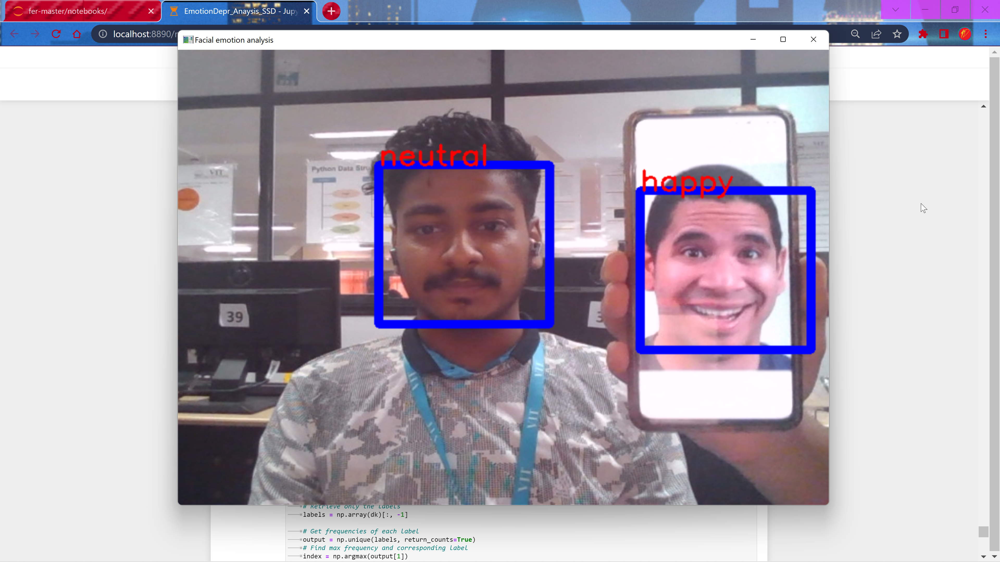

### The User's emotion history being saved in a file, so that later on, we can analyse and the dataset can be used  to predict Depression



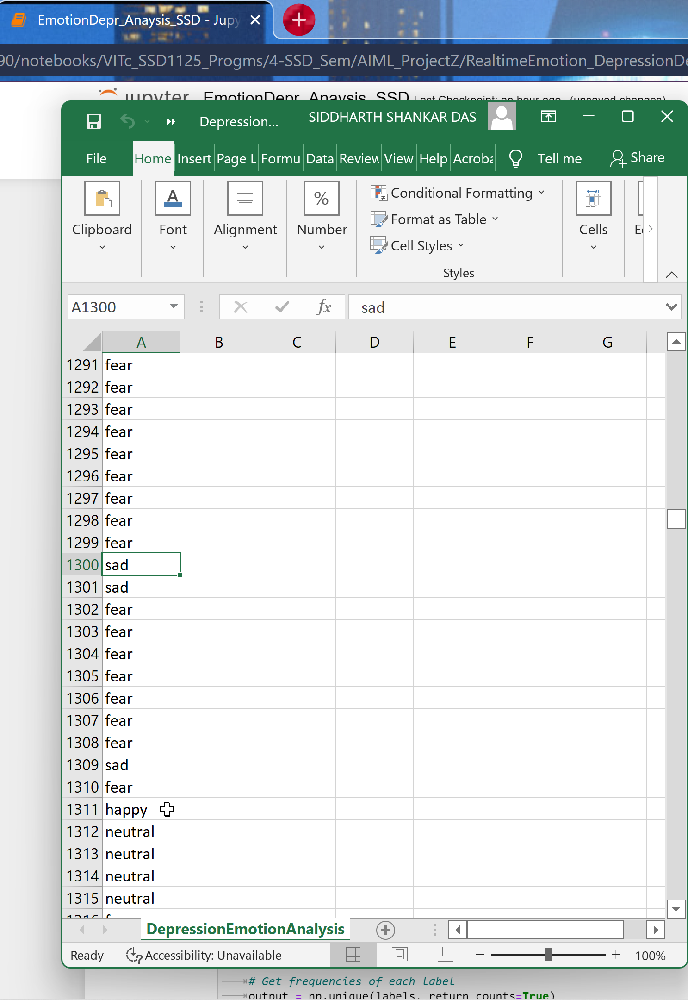



Ex. if our Project predicts 100 times, 'SAD', then It'll assume depression, and do things according to the pre-conditions

# Conclusion:
The code is working Successfully and is able to detect the correct emotions. as well as save it in the CSV file for depression detection
We are also able to save the emotions history in a dataset for future use.